# Breaching privacy

This notebook does the same job as the cmd-line tool `breach.py`, but also directly visualizes the user data and reconstruction

In [1]:
import torch
import hydra
from omegaconf import OmegaConf
%load_ext autoreload
%autoreload 2

import breaching

### Initialize cfg object and system setup:

This will print out all configuration options. 
There are a lot of possible configurations, but there is usually no need to worry about most of these. Below, a few options are printed.

In [2]:
with hydra.initialize(config_path="config"):
    cfg = hydra.compose(config_name='cfg', overrides=['case/server=malicious-model'])
    print(f'Investigating use case {cfg.case.name} with server type {cfg.case.server.name}.')
    print('Attack settings are:')
    print(OmegaConf.to_yaml(cfg.attack))
          
device = torch.device(f'cuda:2') if torch.cuda.is_available() else torch.device('cpu')
torch.backends.cudnn.benchmark = cfg.case.impl.benchmark
setup = dict(device=device, dtype=getattr(torch, cfg.case.impl.dtype))
setup

Investigating use case single_imagenet with server type malicious_model.
Attack settings are:
type: invertinggradients
attack_type: optimization
objective:
  type: cosine-similarity
  scale: 1.0
restarts:
  num_trials: 1
  scoring: cosine-similarity
init: randn
optim:
  optimizer: adam
  signed: true
  step_size: 0.1
  boxed: true
  max_iterations: 24000
  step_size_decay: step-lr
  langevin_noise: 0.0
  warmup: 0
  callback: 1000
regularization:
  total_variation:
    scale: 0.2
    inner_exp: 1
    outer_exp: 1
  orthogonality:
    scale: 0.0



{'device': device(type='cuda', index=2), 'dtype': torch.float32}

### Modify config options here

You can use `.attribute` access to modify any of these configurations:

In [3]:
cfg.case.user.data_idx = 200
cfg.case.user.data_with_labels = 'unique'

cfg.case.user.num_data_points = 64
cfg.case.server.model_modification.type = 'ImprintBlock' 
cfg.case.server.model_modification.num_bins = 64
cfg.case.server.model_modification.position = None # '4.0.conv'
cfg.case.server.model_modification.connection = 'add'


cfg.case.server.model_modification.linfunc = 'fourier'
cfg.case.server.model_modification.mode = 32

cfg.case.model='resnet18'

### Instantiate all parties

In [4]:
user, server = breaching.cases.construct_case(cfg.case, setup)
attacker = breaching.attacks.prepare_attack(server.model, server.loss, cfg.attack, setup)

Model architecture <class 'torch.nn.modules.container.Sequential'> loaded with 21,323,368 parameters and 9,620 buffers.
Overall this is a data ratio of       2:1 for target shape [64, 3, 224, 224] given that num_queries=1.


In [5]:
print(user)
print(server)
print(attacker)

User (of type UserSingleStep with settings:
            number of data points: 64
            number of user queries 1

            Threat model:
            User provides labels: True
            User provides number of data points: True

            Model:
            model specification: Sequential
            loss function: CrossEntropyLoss()

            Data:
            Dataset: ImageNet
            data_idx: 200
        


### Simulate an attacked FL protocol

True user data is returned only for analysis

In [6]:
server_payload = server.distribute_payload()
shared_data, true_user_data = user.compute_local_updates(server_payload)  
# [(g.mean(), g.std()) for g in shared_data['gradients'][0]]

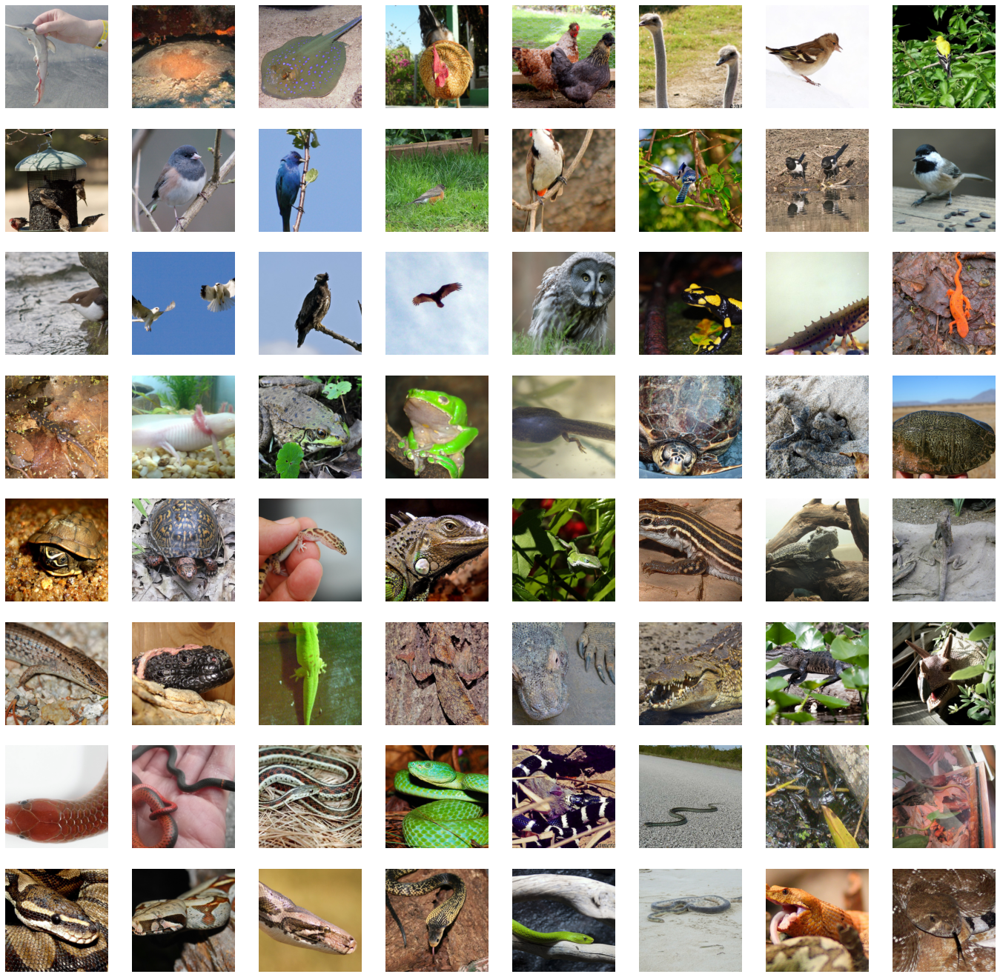

In [7]:
user.plot(true_user_data)

### Reconstruct user data:

In [8]:
reconstructed_user_data, stats = attacker.reconstruct(server_payload, shared_data, 
                                                      server.secrets, dryrun=cfg.dryrun)

# How good is the reconstruction?
metrics = breaching.analysis.report(reconstructed_user_data, true_user_data, 
                                    server_payload, server.model, user.dataloader, setup=setup,
                                    order_batch=True, compute_full_iip=False)

It: 1. Rec. loss: 1.4199. T: 0.96s
It: 1001. Rec. loss: 0.5704. T: 451.80s
It: 2001. Rec. loss: 0.4990. T: 452.79s
It: 3001. Rec. loss: 0.4749. T: 452.83s
It: 4001. Rec. loss: 0.4402. T: 453.17s
It: 5001. Rec. loss: 0.4635. T: 453.13s
It: 6001. Rec. loss: 0.4740. T: 453.23s
It: 7001. Rec. loss: 0.5433. T: 453.30s
It: 8001. Rec. loss: 0.4644. T: 453.18s
It: 9001. Rec. loss: 0.5869. T: 453.18s
It: 10001. Rec. loss: 0.2600. T: 453.28s
It: 11001. Rec. loss: 0.2513. T: 453.30s
It: 12001. Rec. loss: 0.2271. T: 453.35s
It: 13001. Rec. loss: 0.2208. T: 453.39s
It: 14001. Rec. loss: 0.2099. T: 453.38s
It: 15001. Rec. loss: 0.2204. T: 453.48s
It: 16001. Rec. loss: 0.1709. T: 453.58s
It: 17001. Rec. loss: 0.1685. T: 453.66s
It: 18001. Rec. loss: 0.1711. T: 453.63s
It: 19001. Rec. loss: 0.1630. T: 453.69s
It: 20001. Rec. loss: 0.1633. T: 453.67s
It: 21001. Rec. loss: 0.1648. T: 453.70s
It: 22001. Rec. loss: 0.1552. T: 453.77s
It: 23001. Rec. loss: 0.1527. T: 453.80s
It: 24000. Rec. loss: 0.1529. T

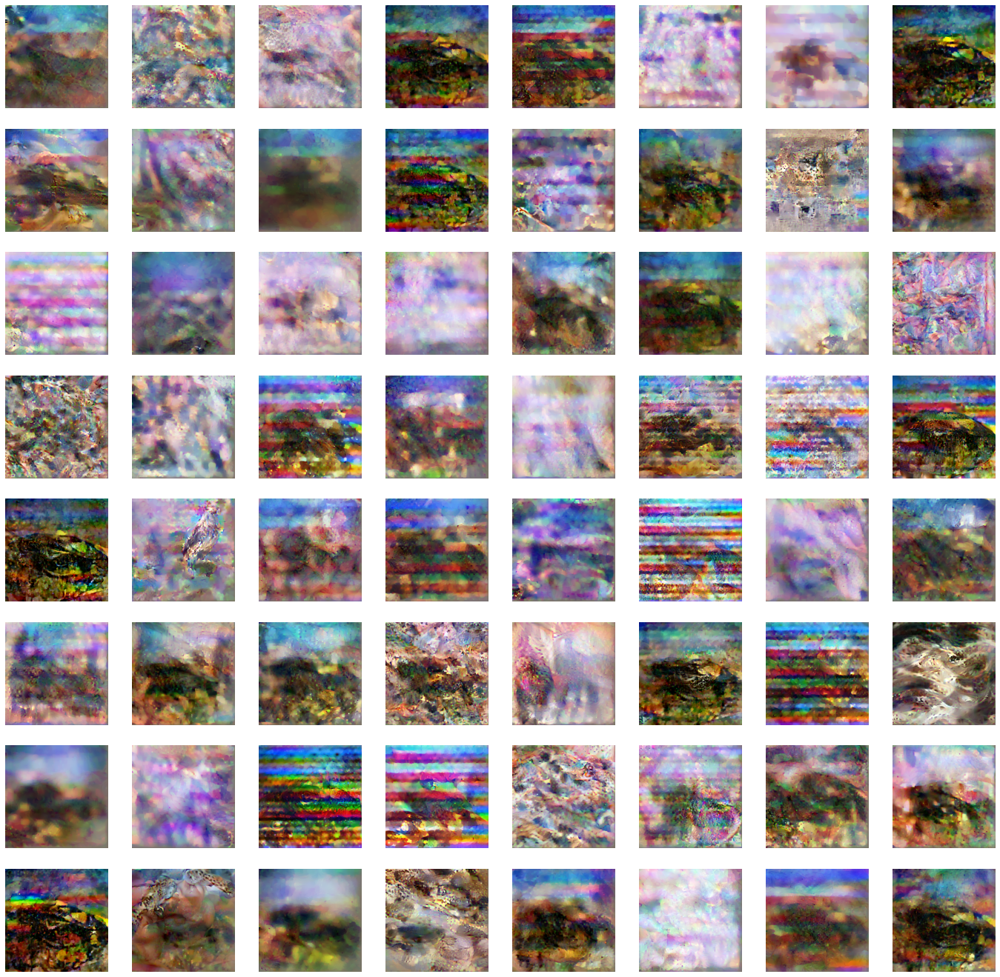

In [9]:
user.plot(reconstructed_user_data)

In [10]:
metrics = breaching.analysis.report(reconstructed_user_data, true_user_data, 
                                    server_payload, server.model, user.dataloader, setup=setup,
                                    order_batch=True, compute_full_iip=True)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /home/jonas/miniconda3/envs/dl/lib/python3.9/site-packages/lpips/weights/v0.1/alex.pth
METRICS: | MSE: 0.0892 | PSNR: 10.73 | FMSE: 1.0134e+01 | LPIPS: 0.72| R-PSNR:  nan | IIP-pixel: 3.12% | IIP-lpips: 14.06% | IIP-self: 10.94%


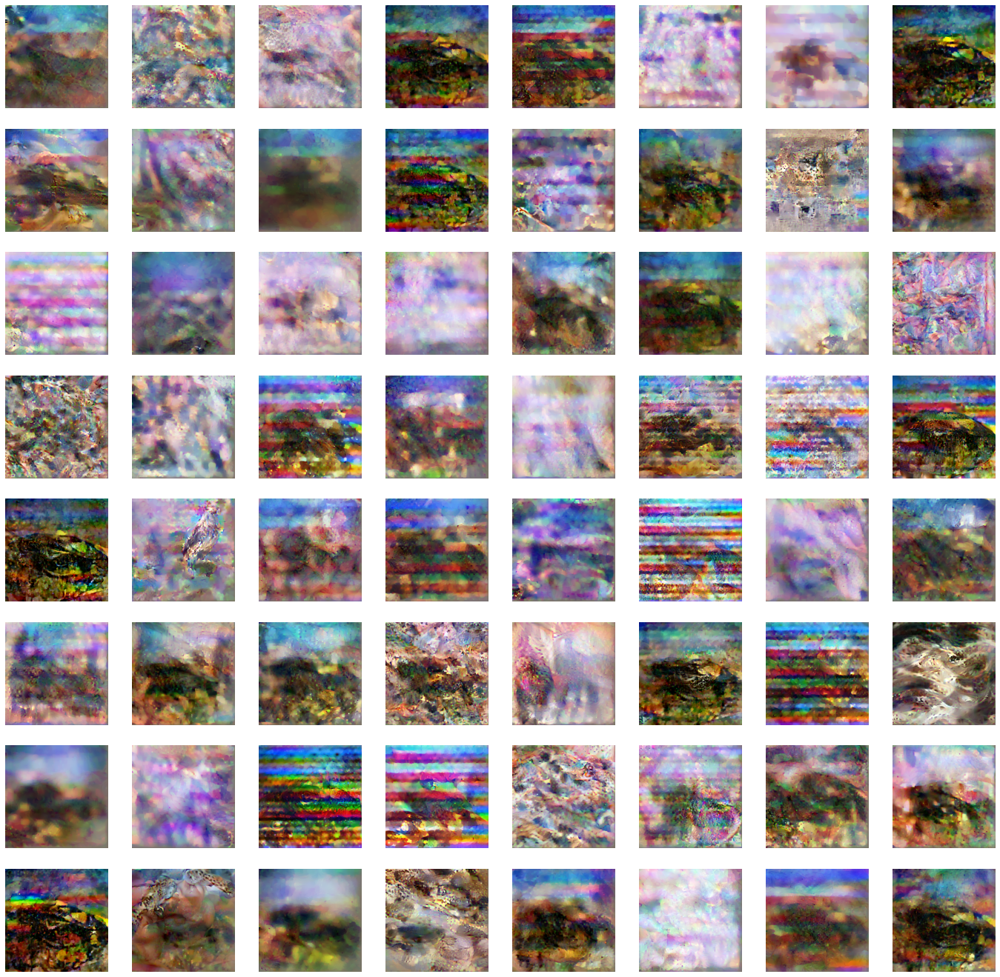

In [11]:
user.plot(reconstructed_user_data)